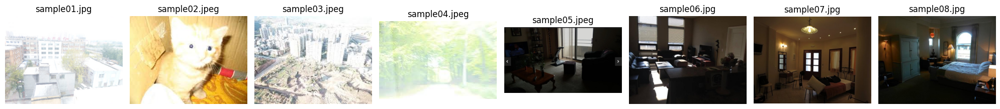

In [110]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
from pathlib import Path

def load_images_from_directory(directory_path):
    images = []
    filenames = []
    
    # Create path object
    img_dir = Path(directory_path)
    
    # Get all image files and sort them
    image_files = sorted(list(img_dir.glob('*.jpg')) + list(img_dir.glob('*.jpeg')))
    
    for filepath in image_files:
        img = cv2.imread(str(filepath))
        if img is not None:
            images.append(img)
            filenames.append(filepath.name)
    return images, filenames

def display_images(images, titles, figsize=(20, 5), cmap=None):
    n_images = len(images)
    fig, axes = plt.subplots(1, n_images, figsize=figsize)

    for ax, img, title in zip(axes, images, titles):
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax.imshow(img_rgb)
        
        ax.set_title(title)
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

images, filenames = load_images_from_directory('images')
display_images(images, filenames)

In [111]:
# Compare multiple L channels from the same source images.
def compare_l_channels(channel_arrays, figsize=None):
    n_methods = len(channel_arrays)
    n_images = len(channel_arrays[0]) if channel_arrays else 0
    
    if n_methods == 0 or n_images == 0:
        print("No channels to compare")
        return
    
    # Auto-calculate figure size if not provided
    if figsize is None:
        figsize = (4 * n_methods, 3 * n_images)
    
    # Create subplots: rows for images, columns for methods
    fig, axes = plt.subplots(n_images, n_methods, figsize=figsize)
    
    # Handle single row or column cases
    if n_images == 1:
        axes = axes.reshape(1, -1)
    elif n_methods == 1:
        axes = axes.reshape(-1, 1)
    
    # Define colors for different methods
    colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown']
    
    # Plot histograms row by row (same source image)
    for img_idx in range(n_images):
        for method_idx in range(n_methods):
            ax = axes[img_idx, method_idx]
            channel = channel_arrays[method_idx][img_idx]
            
            # Calculate and plot histogram
            hist = cv2.calcHist([channel], [0], None, [256], [0, 256])
            color = colors[method_idx % len(colors)]
            ax.plot(hist, color=color, linewidth=1.5)
            ax.fill_between(range(256), hist.flatten(), alpha=0.3, color=color)
            
            # Set axis properties
            ax.set_xlim([0, 255])
            ax.set_xlabel('Intensity')
            ax.set_ylabel('Frequency')
            ax.grid(True, alpha=0.3)
            
            # Add statistics
            mean_val = np.mean(channel)
            std_val = np.std(channel)
            ax.text(0.98, 0.98, f'μ={mean_val:.1f}\nσ={std_val:.1f}', 
                   transform=ax.transAxes, fontsize=8,
                   verticalalignment='top', horizontalalignment='right',
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
    
    plt.tight_layout()
    plt.show()


def compare_images(image_arrays, figsize=None, color_space='BGR'):
    n_methods = len(image_arrays)
    n_images = len(image_arrays[0]) if image_arrays else 0
    
    if n_methods == 0 or n_images == 0:
        print("No images to compare")
        return
    
    # Auto-calculate figure size if not provided - adjusted for row layout
    if figsize is None:
        figsize = (5 * n_methods, 5 * n_images)
    
    # Create subplots: rows for same source images, columns for different methods
    fig, axes = plt.subplots(n_images, n_methods, figsize=figsize)
    
    # Handle single row or column cases
    if n_images == 1:
        axes = axes.reshape(1, -1)
    elif n_methods == 1:
        axes = axes.reshape(-1, 1)
    
    # Plot images row by row (same source image)
    for img_idx in range(n_images):
        for method_idx in range(n_methods):
            ax = axes[img_idx, method_idx]
            img = image_arrays[method_idx][img_idx]
            
            if color_space == 'BGR':
                img_display = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            else:
                img_display = img
            ax.imshow(img_display)
            
            ax.axis('off')
            
            # Add image statistics as text overlay
            mean_val = np.mean(img)
            std_val = np.std(img)
            text_str = f"μ={mean_val:.1f}\nσ={std_val:.1f}"
            ax.text(0.02, 0.98, text_str, transform=ax.transAxes,
                   fontsize=10, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
            
            # Add colored border to distinguish methods
            colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown']
            color = colors[method_idx % len(colors)]
            for spine in ax.spines.values():
                spine.set_edgecolor(color)
                spine.set_linewidth(3)
                spine.set_visible(True)
    
    plt.tight_layout()
    plt.show()

In [112]:
lab_images = []
for i, img in enumerate(images):
    lab_image = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    lab_images.append(lab_image)
    
    filename = filenames[i]

In [113]:
l_channels, a_channels, b_channels = [], [], []

for i, lab_img in enumerate(lab_images):
    l, a, b = cv2.split(lab_img)
    l_channels.append(l)
    a_channels.append(a)
    b_channels.append(b)

    filename = filenames[i]

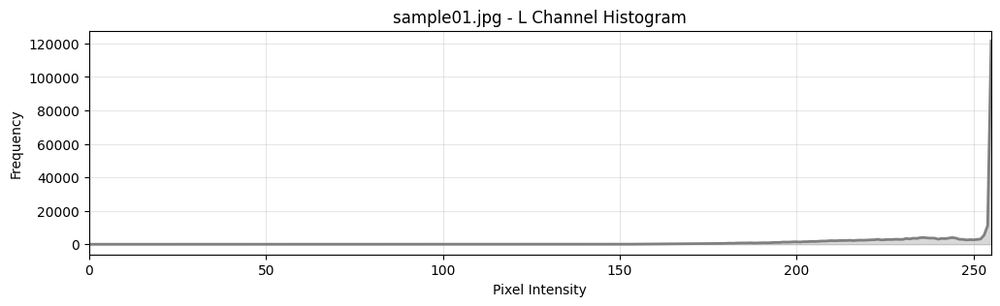

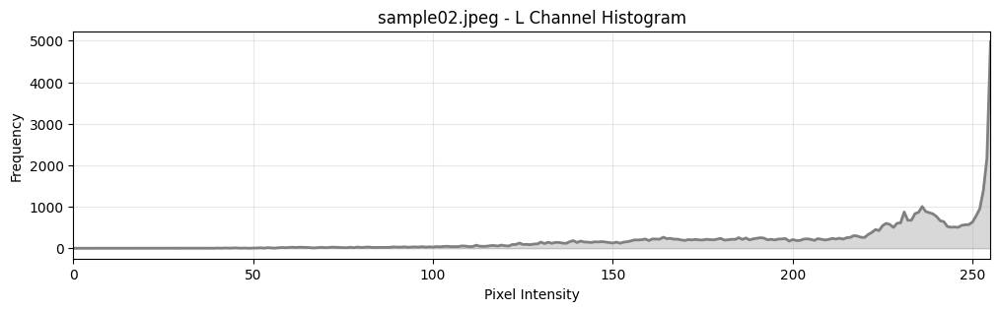

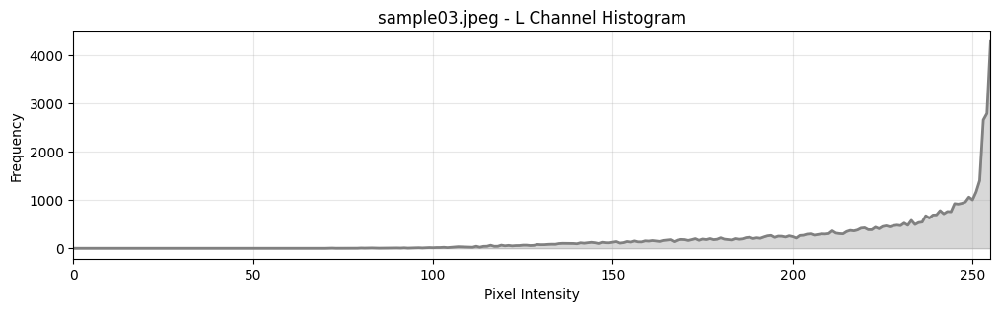

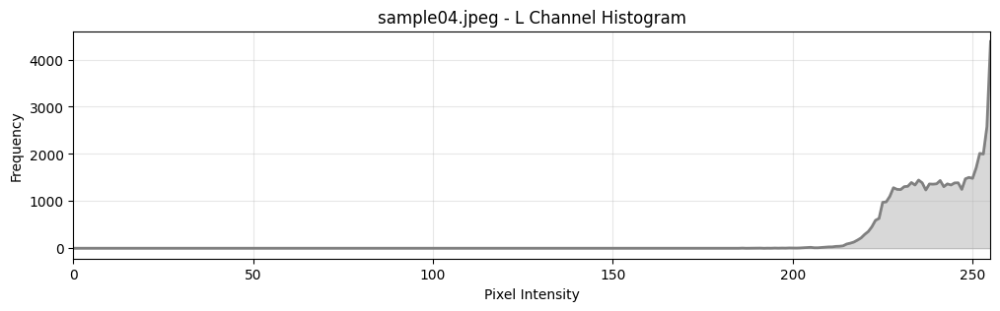

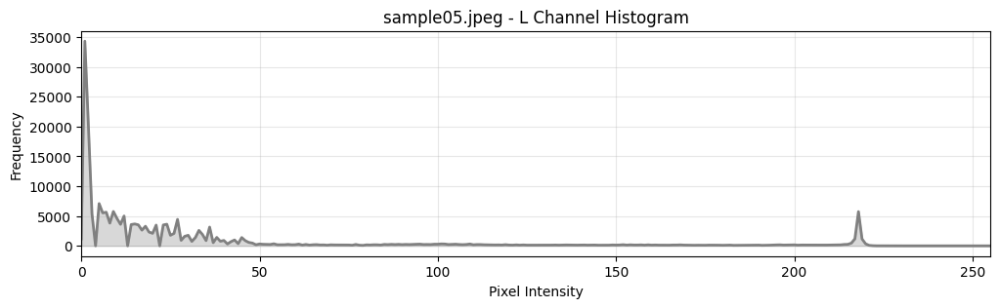

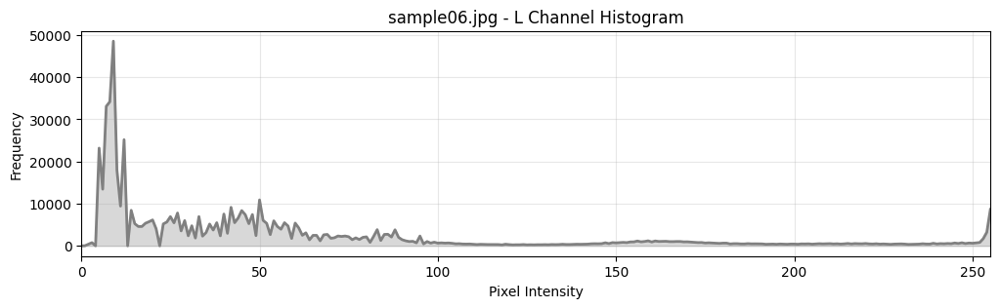

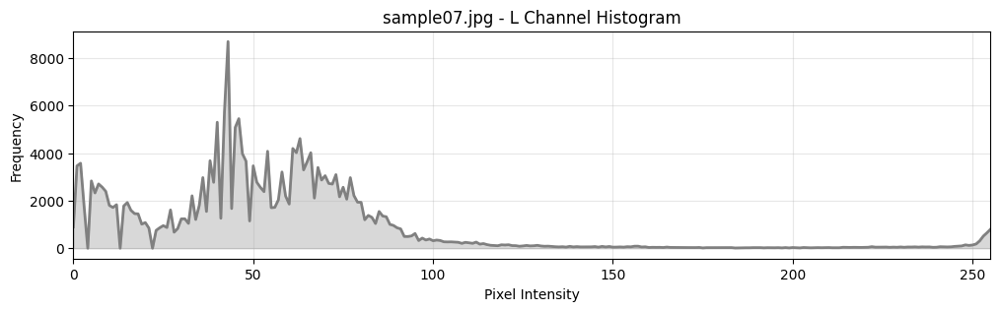

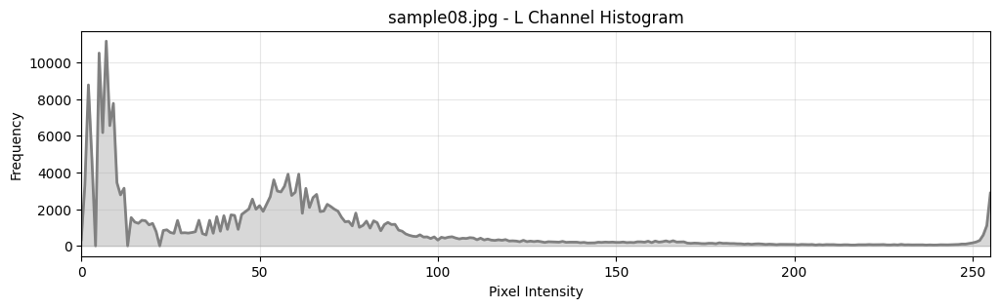

In [114]:
def plot_histograms(channels, titles, color, figsize=(12, 3)):
    n_channels = len(channels)
    
    for i, (channel, title) in enumerate(zip(channels, titles)):
        plt.figure(figsize=figsize)
        max_l = 255 # Not 100 because of unit8 datatype
        hist = cv2.calcHist([channel], [0], None, [max_l + 1], [0, max_l + 1])
        plt.plot(hist, color=color, linewidth=2)
        plt.fill_between(range(256), hist.flatten(), alpha=0.3, color=color)
        plt.title(title)
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')
        plt.xlim([0, max_l])
        plt.grid(True, alpha=0.3)
        plt.show()

plot_histograms(l_channels, 
                [f"{name} - L Channel Histogram" for name in filenames],
                color='gray')

In [115]:
# Define groups based on histogram characteristics
bright_group_indices = [i for i, name in enumerate(filenames) 
                       if any(x in name.lower() for x in ['sample01', 'sample02', 'sample03', 'sample04'])]
dark_group_indices = [i for i, name in enumerate(filenames) 
                     if any(x in name.lower() for x in ['sample05', 'sample06', 'sample07', 'sample08'])]

# Apply Histogram Equalization
he_l_channels = []
he_images = []

for i, l_channel in enumerate(l_channels):
    # Apply histogram equalization to L channel
    he_l = cv2.equalizeHist(l_channel)
    he_l_channels.append(he_l)
    
    # Reconstruct image with equalized L channel
    he_lab = cv2.merge([he_l, a_channels[i], b_channels[i]])
    he_bgr = cv2.cvtColor(he_lab, cv2.COLOR_LAB2BGR)
    he_images.append(he_bgr)

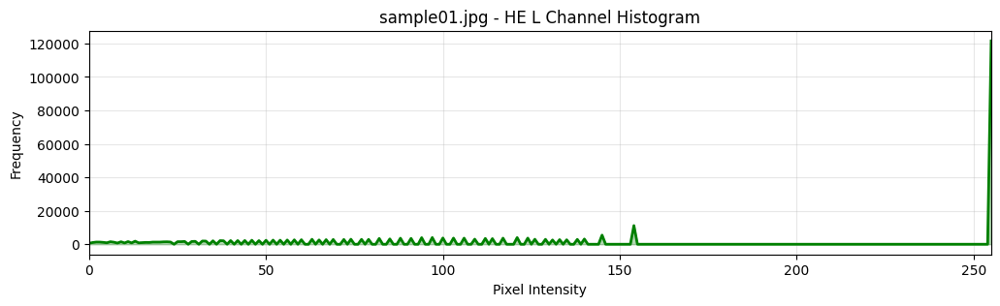

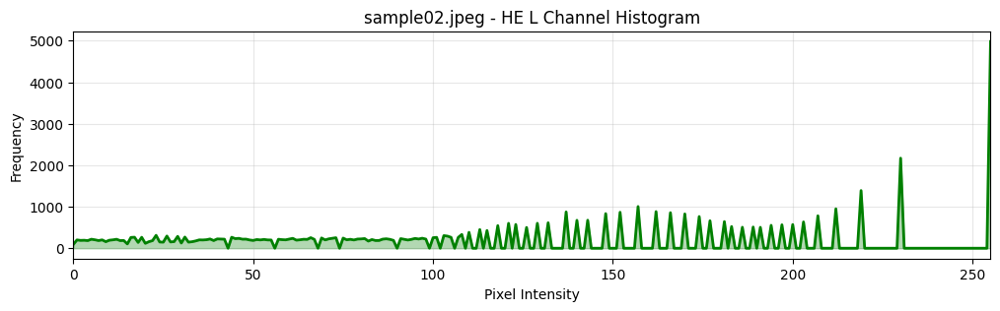

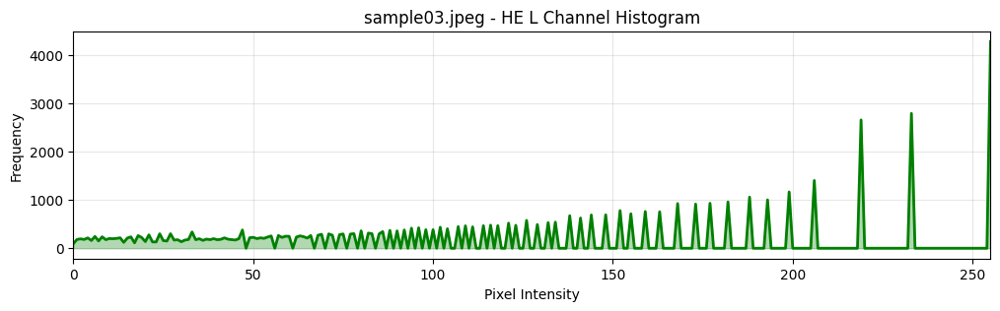

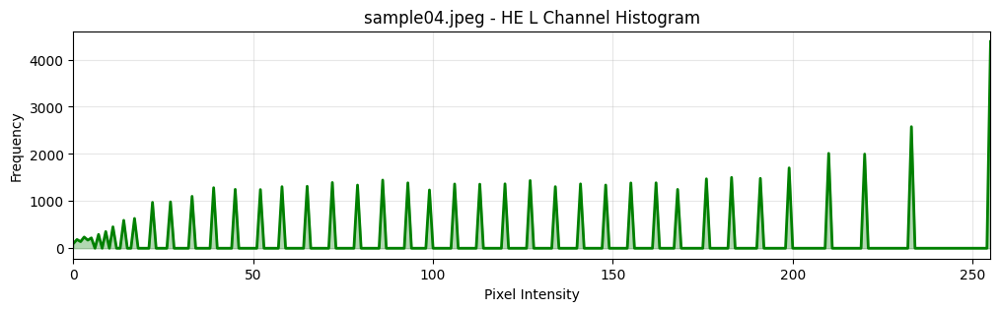

In [116]:
bright_he_channels = [he_l_channels[i] for i in bright_group_indices]
bright_he_titles = [f"{filenames[i]} - HE L Channel Histogram" for i in bright_group_indices]

plot_histograms(bright_he_channels, bright_he_titles, color='green')

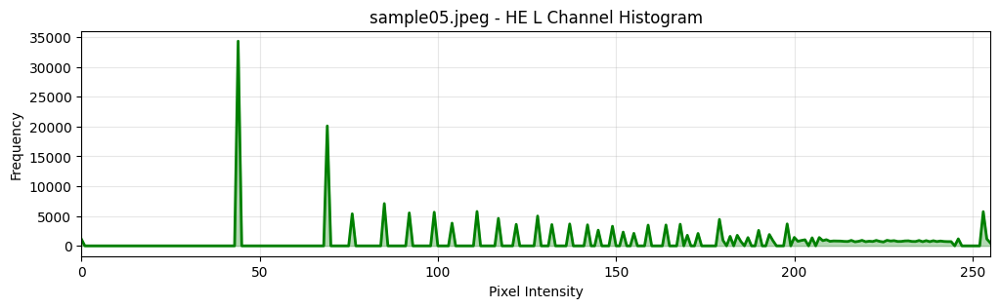

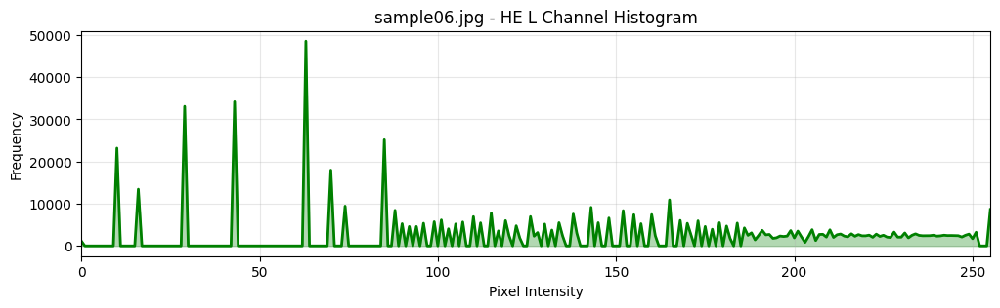

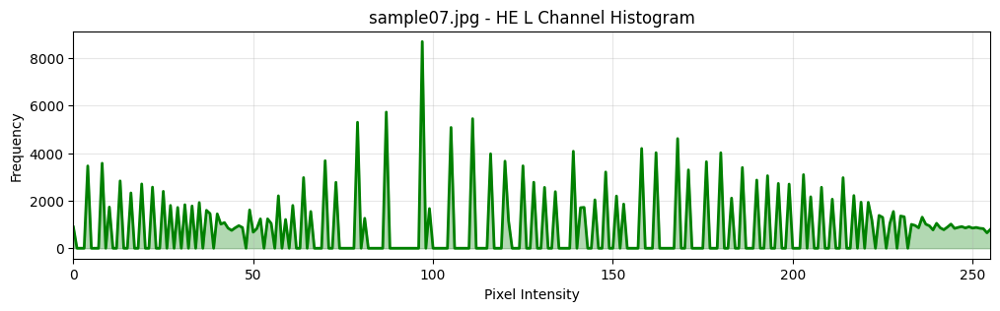

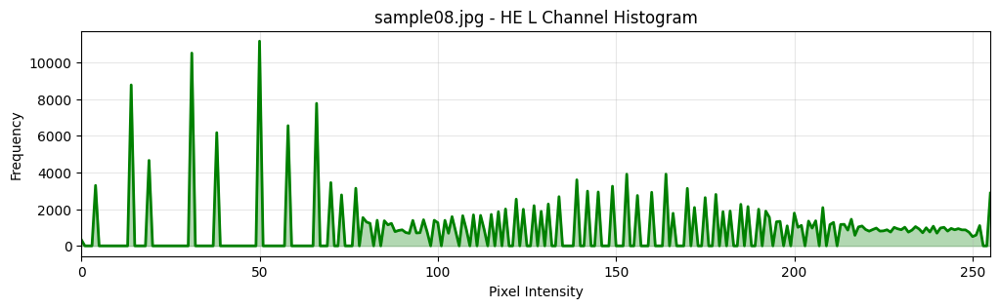

In [117]:
dark_he_channels = [he_l_channels[i] for i in dark_group_indices]
dark_he_titles = [f"{filenames[i]} - HE L Channel Histogram" for i in dark_group_indices]

plot_histograms(dark_he_channels, dark_he_titles, color='green')

In [118]:
# Manual implementation

def manual_histogram_equalization(l_channels, a_channels, b_channels, filenames):
    manual_he_l_channels = []
    manual_he_images = []
    
    for i, l_channel in enumerate(l_channels):
        h, w = l_channel.shape
        
        hist = np.bincount(l_channel.ravel(), minlength=256)
        cdf = hist.cumsum()
        
        cdf_normalized = (cdf - cdf.min()) * 255 / (cdf.max() - cdf.min())
        cdf_normalized = cdf_normalized.astype('uint8')
        
        manual_he_l_channel = cdf_normalized[l_channel]
        manual_he_l_channels.append(manual_he_l_channel)
    
        manual_he_lab = cv2.merge([manual_he_l_channel, a_channels[i], b_channels[i]])
        manual_he_img = cv2.cvtColor(manual_he_lab, cv2.COLOR_LAB2BGR)
    
        manual_he_images.append(manual_he_img)

    return manual_he_l_channels, manual_he_images

manual_he_l_channels, manual_he_images = manual_histogram_equalization(l_channels, a_channels, b_channels, filenames)

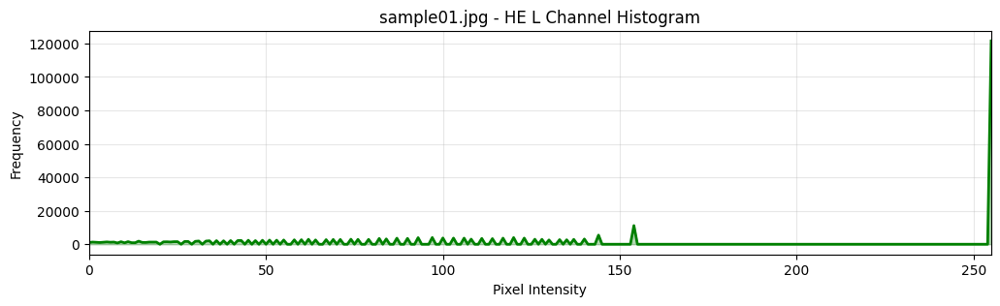

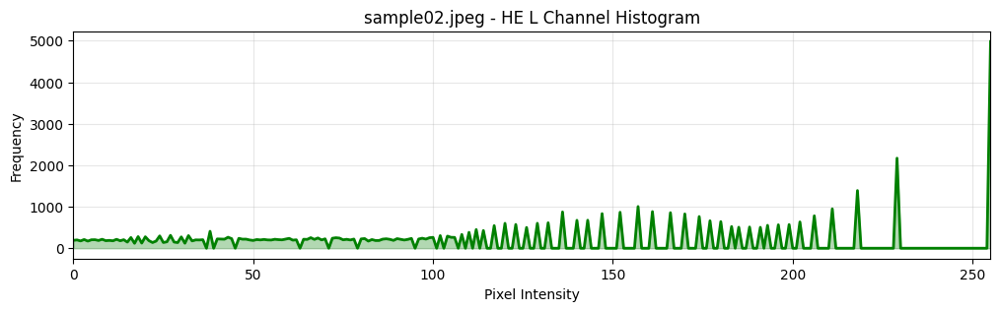

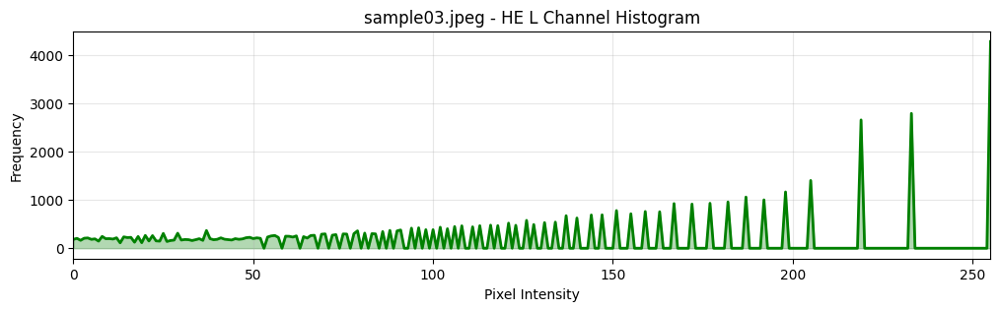

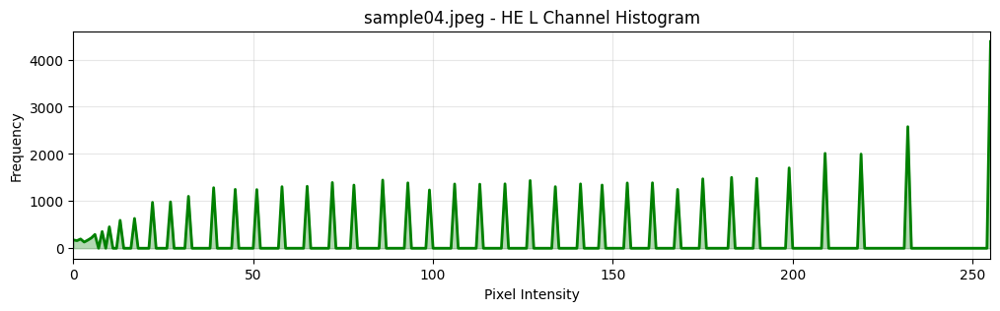

In [119]:
manual_bright_he_channels = [manual_he_l_channels[i] for i in bright_group_indices]
manual_bright_he_titles = [f"{filenames[i]} - HE L Channel Histogram" for i in bright_group_indices]

plot_histograms(manual_bright_he_channels, manual_bright_he_titles, color='green')

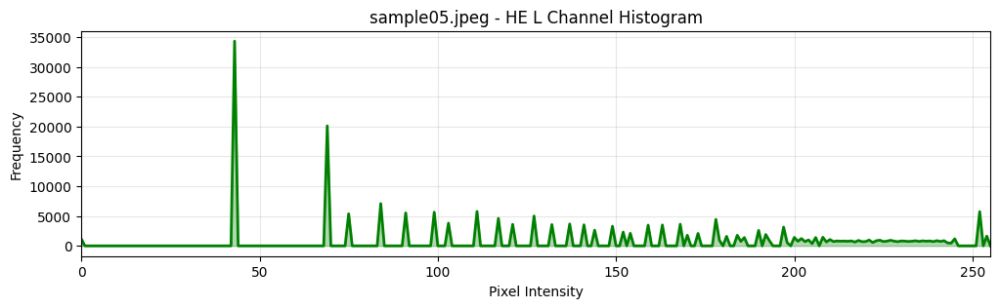

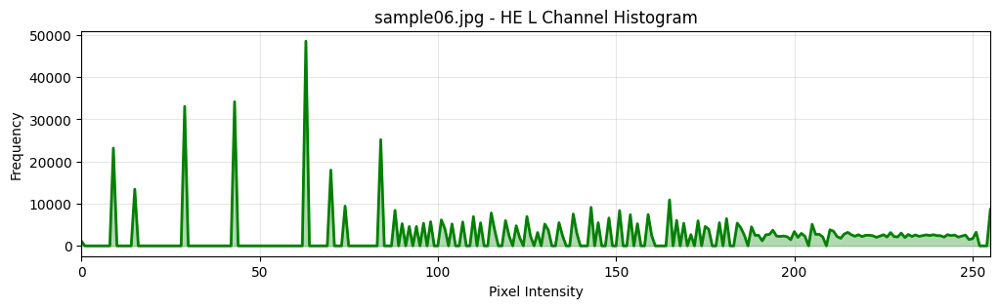

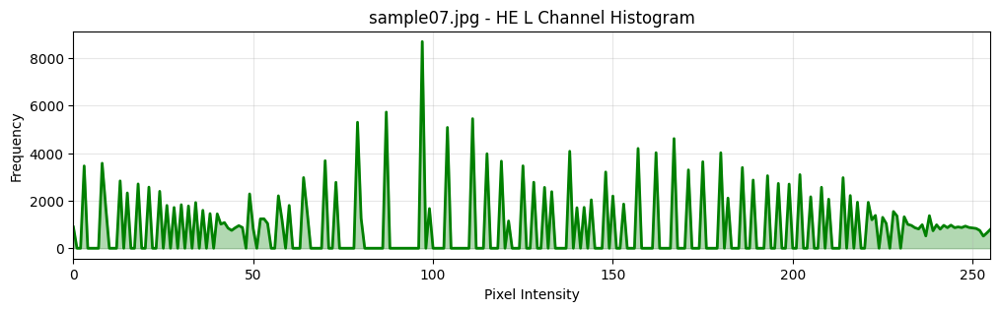

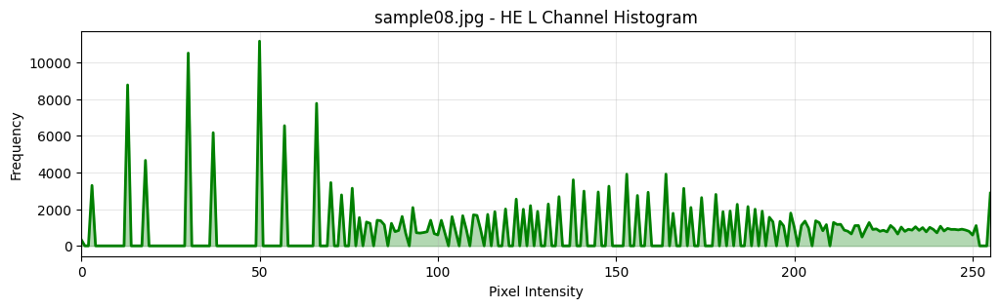

In [120]:
manual_dark_he_channels = [manual_he_l_channels[i] for i in dark_group_indices]
manual_dark_he_titles = [f"{filenames[i]} - HE L Channel Histogram" for i in dark_group_indices]

plot_histograms(manual_dark_he_channels, manual_dark_he_titles, color='green')

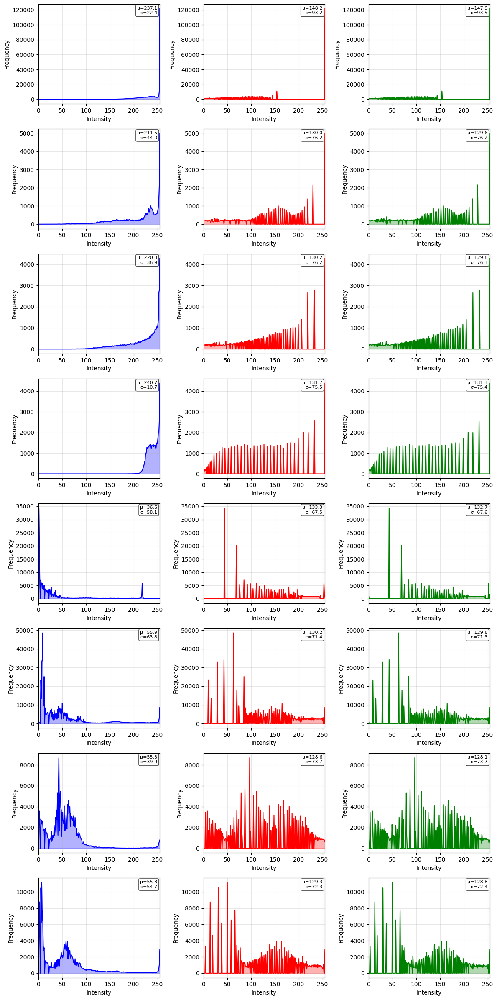

In [121]:
compare_l_channels([l_channels, he_l_channels, manual_he_l_channels])

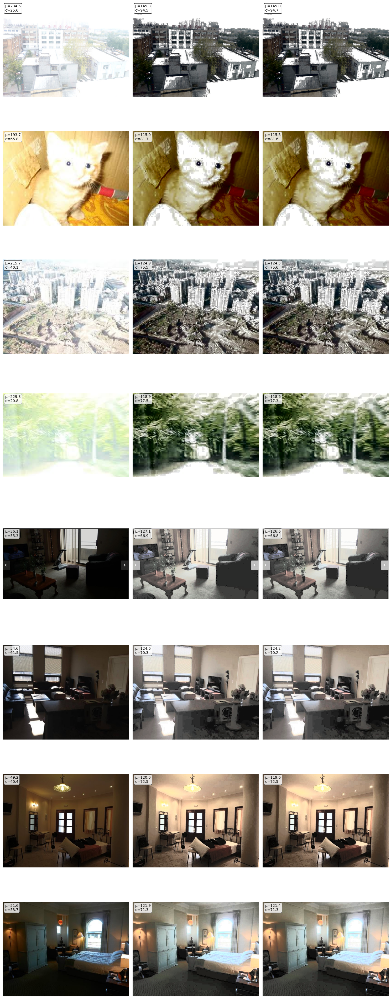

In [122]:
compare_images([images, he_images, manual_he_images])

## Difference between OpenCV and Manual Implementation

**Link:** https://github.com/opencv/opencv/blob/master/modules/imgproc/src/histogram.cpp

Key parts of the OpenCV code:
```cpp
// Find first non-zero histogram bin
int i = 0;
while (!hist[i]) ++i;

int total = (int)src.total();
if (hist[i] == total) {
    dst.setTo(i);  // All pixels have same value
    return;
}

// Scale calculation
float scale = (hist_sz - 1.f)/(total - hist[i]);
int sum = 0;

// Build LUT
for (lut[i++] = 0; i < hist_sz; ++i) {
    sum += hist[i];
    lut[i] = saturate_cast<uchar>(sum * scale);
}
```

Results are slightly different and I could found out some reasons.

1. Zero Handling and Handle Edge Case

   OpenCV starts computation from the first non-zero histogram bin, excluding zero-valued bins from scale calculation. However, my manual implementation use simple approach, `cdf - cdf.min()`, without special handling for zero bins. My code might fail if all pixels have the same value because denominator will be zero.

2. Scale Factor Calcuation

   OpenCV: `scale = 255 / ( total - hist[first_non_zero])`

   Manual: `scale = 255 / cdf.max() - cdf.min()`

   The key difference is that OpenCV excludes the first non-zero histogram value from the denominator, while the manual implementation uses the full CDF range.

So in code, we can express like this.

3. LUT

   LUT means Lookup Table. LUT is an array that replaces runtime computation of a mathematical function. LUT matters because it reveals fundamental differences in how the transformation is applied, not just what transformation is applied. I used directly indexes into the normalized CDF (`cdf_normalized[l_channel]`). But OpenCV is pre-computing a 256-element LUT array, then applies `lut[pixel_value]` for each pixel.

```python3
# OpenCV
cdf_min = cdf[cdf > 0].min()
cdf_normalized = (cdf - cdf_min) * 255 / (cdf.max() - cdf_min)

# Manual
cdf_normalized = (cdf - cdf.min()) * 255 / (cdf.max() - cdf.min())
```

In [123]:
# Manual implementation (With Zero Handling and Scale Factor Calcuation)

def opencv_style_histogram_equalization(l_channels, a_channels, b_channels, filenames):
    opencv_he_l_channels = []
    opencv_he_images = []
    
    for i, l_channel in enumerate(l_channels):
        h, w = l_channel.shape
        total_pixels = h * w
        hist = np.bincount(l_channel.ravel(), minlength=256)
        
        first_nonzero = 0
        while first_nonzero < 256 and hist[first_nonzero] == 0:
            first_nonzero += 1
        
        if first_nonzero >= 256 or hist[first_nonzero] == total_pixels:
            # All pixels have the same value, return original
            opencv_he_l_channels.append(l_channel.copy())
            opencv_he_lab = cv2.merge([l_channel.copy(), a_channels[i], b_channels[i]])
            opencv_he_img = cv2.cvtColor(opencv_he_lab, cv2.COLOR_LAB2BGR)
            opencv_he_images.append(opencv_he_img)
            
            continue
        
        scale = 255 / (total_pixels - hist[first_nonzero])
        
        lut = np.zeros(256, dtype=np.uint8)
        lut[first_nonzero] = 0  # First value maps to 0
        
        cumulative_sum = 0
        for j in range(first_nonzero + 1, 256):
            cumulative_sum += hist[j]
            # Apply saturation (like OpenCV's saturate_cast)
            lut_value = cumulative_sum * scale
            lut[j] = np.clip(lut_value, 0, 255).astype(np.uint8)
        
        enhanced_l_channel = lut[l_channel]
        opencv_he_l_channels.append(enhanced_l_channel)
        
        opencv_he_lab = cv2.merge([enhanced_l_channel, a_channels[i], b_channels[i]])
        opencv_he_img = cv2.cvtColor(opencv_he_lab, cv2.COLOR_LAB2BGR)
        opencv_he_images.append(opencv_he_img)

    return opencv_he_l_channels, opencv_he_images

opencv_style_he_l_channels, opencv_style_he_images = opencv_style_histogram_equalization(l_channels, a_channels, b_channels, filenames)

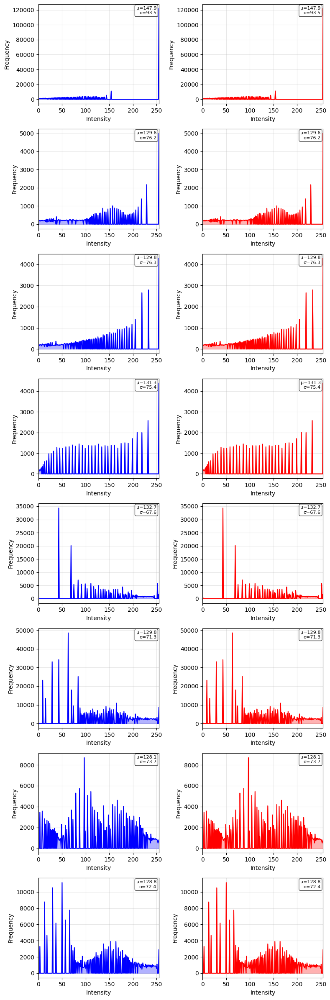

In [124]:
compare_l_channels([manual_he_l_channels, opencv_style_he_l_channels])

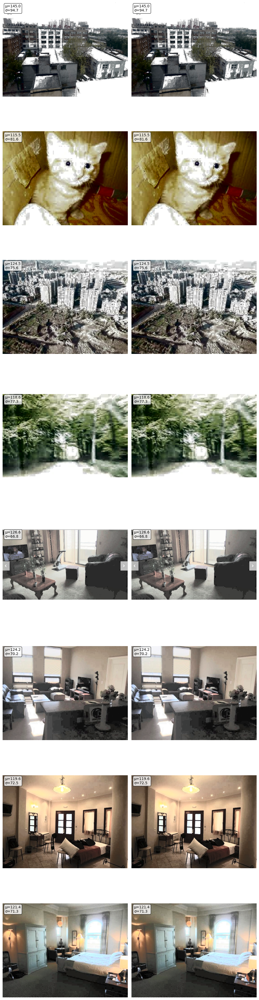

In [125]:
compare_images([manual_he_images, opencv_style_he_images])

# AHE and CLAHE

What is the purpose of HE? To improve contrast, standarize image appearnace and highlight features such as edges, textures, and details. But HE has certain limitations.

First of all, it doesn't preserve natural brightness. In some pictures, certain part is very brightness but others are not. But HE cannot preserve that kind of information.

Second, when there's noise in the picture, it can over-amplify it. Because it's looking at all the picture, but not the local part of the picture.

That's the reason why AHE and CLAHE come out.
AHE divides the image into small regions and apply HE per each region. But if the small region have different brightness conditions in it, it can over-amplify noise in certain area.
So CLAHE comes out. It adds a clip limit for how tall any histogram bin can be. If a bin exceeds the limit, the extra counts are clipped off. And the clipped counts are redistributed evenly across all bins in ths histogram. It should be redistributed because if it clipped off and do not redistribute, the histogram total won't match the number of pixels then the CDF won't span the full dynamic range.

In [126]:
# Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)
clahe_l_channels = []
clahe_images = []

# Create CLAHE object with customizable parameters
clahe = cv2.createCLAHE(clipLimit=0.5, tileGridSize=(8,8))

for i, l_channel in enumerate(l_channels):
    clahe_l = clahe.apply(l_channel)
    clahe_l_channels.append(clahe_l)
    
    clahe_lab = cv2.merge([clahe_l, a_channels[i], b_channels[i]])
    clahe_bgr = cv2.cvtColor(clahe_lab, cv2.COLOR_LAB2BGR)
    clahe_images.append(clahe_bgr)

In [127]:
def manual_clahe(l_channels, a_channels, b_channels, filenames, clip_limit, tile_size):
    clahe_l_channels = []
    clahe_images = []

    tile_rows, tile_cols = tile_size

    # Iterate over each image's channels
    for i, l_channel in enumerate(l_channels):
        h, w = l_channel.shape
        
        pad_w = (tile_cols - (w % tile_cols)) % tile_cols
        pad_h = (tile_rows - (h % tile_rows)) % tile_rows

        # Pad the L-channel using reflection to minimize edge artifacts
        padded_l = np.pad(l_channel, ((0, pad_h), (0, pad_w)), mode='reflect')
        padded_h, padded_w = padded_l.shape
        
        num_tiles_x = padded_w // tile_cols
        num_tiles_y = padded_h // tile_rows

        # Calculate clipped histograms and CDFs
        luts = []
        num_pixels_in_tile = tile_rows * tile_cols
        
        # Calculate the actual clip limit from the provided float value
        actual_clip_limit = max(1, int(clip_limit * num_pixels_in_tile / 256) if clip_limit > 0 else num_pixels_in_tile)

        for r in range(num_tiles_y):
            for c in range(num_tiles_x):
                # Extract the tile
                tile = padded_l[r*tile_rows:(r+1)*tile_rows, c*tile_cols:(c+1)*tile_cols]
                
                # Calculate the tile's histogram
                hist, _ = np.histogram(tile, bins=256, range=[0, 256])
                
                # Clip the histogram
                total_excess = 0
                for bin_idx in range(256):
                    if hist[bin_idx] > actual_clip_limit:
                        total_excess += hist[bin_idx] - actual_clip_limit
                        hist[bin_idx] = actual_clip_limit
                
                # Redistribute the excess pixels
                redist_val_per_bin = total_excess // 256
                hist += redist_val_per_bin
                
                # Distribute the remainder
                rem_excess = total_excess % 256
                hist[:rem_excess] += 1
                
                # Calculate the CDF
                cdf = hist.cumsum()
                
                # Normalize the CDF to create the LUT for this tile
                lut = ((cdf - cdf.min()) * 255) / (cdf.max() - cdf.min())
                luts.append(lut.astype('uint8'))
        
        # Create an empty array for the new L-channel
        clahe_l_channel_float = np.zeros_like(l_channel, dtype=np.float32)

        # Iterate over each pixel of the original image to calculate its new value
        for r_orig in range(h):
            for c_orig in range(w):
                pixel_val = l_channel[r_orig, c_orig]
                
                # Determine which tile the pixel belongs to
                tile_y_idx = r_orig // tile_rows
                tile_x_idx = c_orig // tile_cols

                # Calculate the pixel's normalized position within the tile (from 0 to 1)
                # These are the weights for the interpolation
                y_norm = (r_orig % tile_rows) / tile_rows
                x_norm = (c_orig % tile_cols) / tile_cols

                # Get the indices of the 4 surrounding LUTs (handling boundaries)
                idx_tl = tile_y_idx * num_tiles_x + tile_x_idx
                idx_tr = idx_tl + 1 if tile_x_idx < num_tiles_x - 1 else idx_tl
                idx_bl = (tile_y_idx + 1) * num_tiles_x + tile_x_idx if tile_y_idx < num_tiles_y - 1 else idx_tl
                idx_br_y = tile_y_idx + 1 if tile_y_idx < num_tiles_y - 1 else tile_y_idx
                idx_br_x = tile_x_idx + 1 if tile_x_idx < num_tiles_x - 1 else tile_x_idx
                idx_br = idx_br_y * num_tiles_x + idx_br_x
                
                # Get the mapped values from each of the 4 relevant LUTs
                val_tl = luts[idx_tl][pixel_val]
                val_tr = luts[idx_tr][pixel_val]
                val_bl = luts[idx_bl][pixel_val]
                val_br = luts[idx_br][pixel_val]
                
                # Interpolate horizontally
                top_interp = (1 - x_norm) * val_tl + x_norm * val_tr
                bottom_interp = (1 - x_norm) * val_bl + x_norm * val_br
                
                # Interpolate vertically
                final_val = (1 - y_norm) * top_interp + y_norm * bottom_interp
                clahe_l_channel_float[r_orig, c_orig] = final_val

        clahe_l_channel = clahe_l_channel_float.astype('uint8')
        clahe_l_channels.append(clahe_l_channel)

        # Merge channels and convert back to BGR
        clahe_lab = cv2.merge([clahe_l_channel, a_channels[i], b_channels[i]])
        clahe_img = cv2.cvtColor(clahe_lab, cv2.COLOR_LAB2BGR)
        clahe_images.append(clahe_img)
        
    return clahe_l_channels, clahe_images

manual_clahe_l_channels, manual_clahe_images = manual_clahe(
    l_channels, 
    a_channels, 
    b_channels, 
    filenames, 
    clip_limit=0.5, 
    tile_size=(8, 8)
)

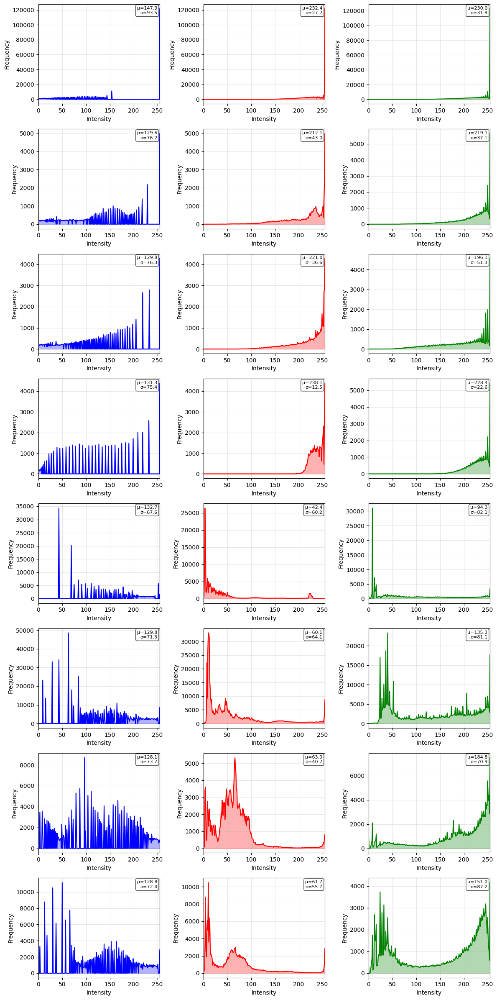

In [128]:
compare_l_channels([opencv_style_he_l_channels, clahe_l_channels, manual_clahe_l_channels])

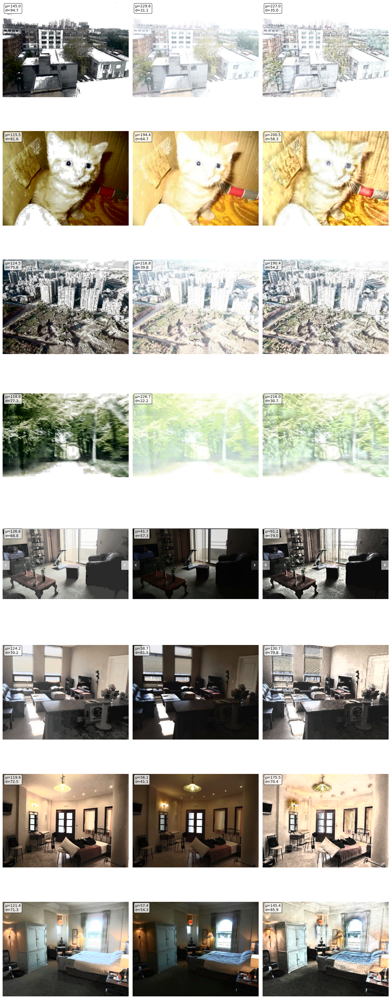

In [129]:
compare_images([opencv_style_he_images, clahe_images, manual_clahe_images])

### ## Analysis of Implementation-Specific Variations in CLAHE Algorithm Outputs

The successful implementation of the Contrast Limited Adaptive Histogram Equalization (CLAHE) algorithm in Python with NumPy yields results that are visually and functionally equivalent to those produced by the standard OpenCV library. However, a detailed numerical comparison reveals minor, pixel-level differences between the two outputs. These subtle deviations are not indicative of an error in the manual implementation's logic but are an expected consequence of inherent differences in low-level implementation strategies between a high-level script and an optimized, compiled library. This analysis outlines the primary technical reasons for these variations.

The most significant source of discrepancy arises from the precise execution of the **bilinear interpolation** step. While the fundamental concept of interpolation is the same, the specific coordinate system used to calculate the weights can differ. The custom implementation calculates a pixel's position relative to the boundaries of its local tile. In contrast, highly optimized libraries like OpenCV often define the mapping function (the Cumulative Distribution Function, or CDF) at the exact center of each tile. Consequently, the interpolation for a given pixel is performed based on its position relative to the four nearest *tile centers*. This slight shift in the reference grid alters the interpolation weights for every pixel, systematically causing small but consistent differences in the final computed intensity values across the entire image.

Furthermore, variations in **numerical precision and rounding** contribute to the observed differences. The Python environment, utilizing NumPy, typically performs intermediate floating-point calculations with 64-bit double-precision. OpenCV, written in C++ with a focus on performance, is more likely to use 32-bit single-precision floats for these operations. This difference in precision, coupled with the exact point at which rounding occurs during the multi-stage interpolation formula, can easily alter the final integer value of a pixel. A calculated value of `142.49999999999997` in 64-bit precision would truncate to a final pixel value of 142, whereas a slightly different calculation in 32-bit precision might result in `142.50001`, which rounds to 143. These minor yet critical rounding events accumulate throughout the image.

Finally, the **histogram clipping and redistribution** process presents another opportunity for implementation variance. The manual script employs a direct, single-pass method where the excess pixel count from clipped histogram bins is averaged and redistributed uniformly across all bins. Production-level libraries may employ a more complex, iterative redistribution algorithm. Such an algorithm would repeatedly clip and redistribute the newly created excess in subsequent passes until a stable state is achieved, ensuring no bin is inadvertently pushed over the limit by the redistribution itself. This more rigorous process results in a slightly different final CDF for each tile, which directly influences the lookup tables used for interpolation and, therefore, the final pixel values. In conclusion, the observed numerical differences are a direct result of these specific, low-level choices in mathematical and computational strategy rather than a flaw in the algorithmic logic itself.

# The Efficacy of the Bilateral Filter for Photographic Noise Reduction

The primary challenge in digital image noise reduction is the inherent trade-off between suppressing unwanted artifacts and preserving meaningful structural details such as edges and textures. Conventional spatial filters, like the Gaussian filter, operate under the assumption of local signal coherence, effectively smoothing a pixel by averaging its value with those of its neighbors. While effective at reducing random noise, this approach invariably blurs important features, leading to a loss of image sharpness and fidelity. The Bilateral Filter presents an elegant solution to this dilemma by performing context-aware smoothing, making it exceptionally well-suited for processing general photographic noise.

The superiority of the Bilateral Filter stems from its innovative dual-domain weighting mechanism. Unlike a standard filter that only considers the spatial distance between pixels, the Bilateral Filter simultaneously considers photometric distance, or the difference in pixel intensity. It calculates a weight for each neighboring pixel that is a product of two Gaussian functions. The first function assigns a lower weight to pixels that are spatially farther from the center pixel, just as a Gaussian filter does. The second, crucial function assigns a lower weight to pixels whose intensity values are significantly different from the center pixel's value.

This second criterion acts as an intelligent, edge-aware gatekeeper. In smooth, featureless regions of an image, such as a clear sky or a wall, photographic noise manifests as minor, random variations in pixel intensity. Here, a noisy pixel's neighbors are both spatially close and photometrically similar. The Bilateral Filter therefore gives them high weights, and the resulting strong averaging effectively eliminates the noise. However, at a sharp edge—for instance, the boundary between a dark building and a bright sky—a pixel's neighbors across the boundary are spatially close but photometrically dissimilar. The filter's range-based weighting assigns these pixels a near-zero weight, effectively excluding them from the averaging process. A standard Gaussian filter would naively blur across this boundary, but the Bilateral Filter preserves it.

In conclusion, the Bilateral Filter is a superior choice for general photographic noise reduction because its mechanism is intrinsically matched to the nature of the problem. It intelligently distinguishes between the random, high-frequency variations of noise and the structured, high-frequency variations of important image features. By limiting its averaging to pixels that are not only nearby but also "look alike," it achieves a remarkable balance between noise suppression and detail preservation, making it an indispensable tool in modern image processing and computational photography.

In [ ]:
def apply_manual_bilateral(image, diameter, sigma_spatial, sigma_range):
    filtered_image = np.zeros_like(image, dtype=np.float32)
    pad = diameter // 2
    padded_image = np.pad(image, ((pad, pad), (pad, pad)), mode='reflect')
    
    # Pre-calculate spatial weights
    spatial_weights = np.zeros((diameter, diameter))
    for i in range(diameter):
        for j in range(diameter):
            distance_sq = (i - pad)**2 + (j - pad)**2
            spatial_weights[i, j] = np.exp(-distance_sq / (2 * sigma_spatial**2))
            
    h, w = image.shape
    for y in range(h):
        for x in range(w):
            y_padded, x_padded = y + pad, x + pad
            neighborhood = padded_image[y_padded - pad : y_padded + pad + 1,
                                        x_padded - pad : x_padded + pad + 1]
            
            center_pixel_value = padded_image[y_padded, x_padded]
            
            range_diff_sq = (neighborhood.astype(np.float32) - center_pixel_value)**2
            range_weights = np.exp(-range_diff_sq / (2 * sigma_range**2))
            
            combined_weights = spatial_weights * range_weights
            total_weight = np.sum(combined_weights)
            weighted_sum = np.sum(neighborhood * combined_weights)
            
            if total_weight > 0:
                filtered_image[y, x] = weighted_sum / total_weight
            else:
                filtered_image[y, x] = image[y, x] # Fallback in rare cases
            
    return filtered_image.astype(np.uint8)


def manual_bilateral_filter(l_channels, a_channels, b_channels, filenames, 
                                diameter, sigma_spatial, sigma_range):
    manual_bilateral_l_channels_channels = []
    filtered_images = []
    
    # Iterate over each image's channels
    for i, l_channel in enumerate(l_channels):
        h, w = l_channel.shape

        # Apply the bilateral filter only to the L-channel
        manual_bilateral_l_channels = apply_manual_bilateral(l_channel, diameter, sigma_spatial, sigma_range)
        manual_bilateral_l_channels_channels.append(manual_bilateral_l_channels)

        # Merge the filtered L-channel with the original A and B channels
        manual_bilateral_l_channelsab = cv2.merge([manual_bilateral_l_channels, a_channels[i], b_channels[i]])
        
        # Convert the resulting LAB image back to BGR color space
        filtered_img = cv2.cvtColor(manual_bilateral_l_channelsab, cv2.COLOR_LAB2BGR)
        filtered_images.append(filtered_img)

    return manual_bilateral_l_channels_channels, filtered_images

manual_bilateral_l_channels, manual_bilateral_images = manual_bilateral_filter(
    l_channels, 
    a_channels, 
    b_channels, 
    filenames,
    diameter=9,
    sigma_spatial=10,
    sigma_range=10
)

manual_bilateral_clahe_l_channels, manual_bilateral_clahe_images = manual_clahe(
    manual_bilateral_l_channels, 
    a_channels, 
    b_channels, 
    filenames, 
    clip_limit=0.5, 
    tile_size=(8, 8)
)

In [ ]:
compare_l_channels([opencv_style_he_l_channels, manual_clahe_l_channels, manual_bilateral_clahe_l_channels])

In [ ]:
compare_images([opencv_style_he_images, manual_clahe_images, manual_bilateral_clahe_images])

## Hybrid Approach: Blending for Optimal Detail and Noise Control

A single, linear image processing pipeline often forces a compromise between detail enhancement and noise suppression. Applying contrast enhancement techniques like CLAHE directly can amplify unwanted noise along with desirable details. Conversely, preceding enhancement with a strong noise reduction filter, such as the Bilateral Filter, can attenuate fine, desirable textures, leading to an overly smooth or artificial appearance. To overcome this limitation, a hybrid approach utilizing weighted blending was implemented to synthesize a final image that synergistically combines the strengths of two distinct processing paths.

The blending process operates on two source images. The first source, Image A, is the result of applying CLAHE directly to the original luminance channel. This image is characterized by high-frequency detail and enhanced local contrast, but it also retains or even amplifies the original noise. The second source, Image B, is the result of a two-stage pipeline: first applying the Bilateral Filter for noise reduction, followed by the same CLAHE process. This image exhibits excellent noise suppression and clean gradients but at the expense of the fine textural detail that was smoothed by the filter.

The core of the blending technique is a linear interpolation between these two source images, governed by the formula:

Blended Image = α * Image_A + (1 - α) * Image_B

Here, α is a blending coefficient ranging from 0.0 to 1.0 that controls the balance between the two inputs. By selecting an appropriate value for α, typically determined empirically, it is possible to create a composite image that retains the sharp, high-frequency textural details from Image A while simultaneously incorporating the clean, low-noise characteristics of Image B. This method provides decoupled control over detail and noise, allowing for a final result that is both aesthetically sharp and technically clean, overcoming the inherent compromises of a singular processing chain.

In [ ]:
def blend_images(images1, images2, filenames, alpha):
    blended_images = []
    beta = 1.0 - alpha

    for i, filename in enumerate(filenames):
        img1 = images1[i]
        img2 = images2[i]

        blended_img = cv2.addWeighted(img1, alpha, img2, beta, 0.0)
        blended_images.append(blended_img)
        
    return blended_images

blended_images = blend_images(manual_clahe_images, manual_bilateral_clahe_images, filenames, alpha = 0.3)

In [ ]:
compare_images([images, he_images, manual_clahe_images, blended_images])